In [1]:
import copy
from   random import choice
import math 

import numpy as np
from   sklearn.cluster import HDBSCAN, DBSCAN
import hdbscan

import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

import NaiveDE
import SpatialDE
import pandas as pd

from plot import *
from data import *
from filt import *

scdata = load_data()

index_to_cart = np.zeros((len(scdata.obs), 2))
max_row       = scdata.obs['array_row'].max()
for i, ind in enumerate(scdata.obs.index):
    col = scdata.obs['array_col'][ind]
    row = scdata.obs['array_row'][ind]
    index_to_cart[i, 0] = col             * (np.sqrt(3)/2)
    index_to_cart[i, 1] = (max_row - row) * (3/2)

c:\Users\Workstation\magistrale\algo_ai\Lib\site-packages\dask\dataframe\__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
c:\Users\Workstation\magistrale\algo_ai\Lib\site-packages\numba\core\decorators.py:246: RuntimeWarning: nopython is set for njit and is ignored
  warnings.warn('nopython is set for njit and is ignored', RuntimeWarning)
c:\Users\Workstation\magistrale\algo_ai\Lib\site-packages\anndata\utils.py:429: FutureWarning: Importing read_text from `anndata` is deprecated. Import anndata.io.read_text instead.
  warnings.warn(msg, FutureWarning)
c:\Users\Workstation\magistrale\algo_ai\Lib\site-packages\anndata\_core\anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_

noisy: [ 23758, 20428, 27588, 20428, 17371, 4026, 25081, 17855 ]

big cluster:
    bottom left: [ 6546, 29859, 888, 29117, 10542, 18234]
    top right:   [ 14704, 32600, 29313, 4756, 28546, 31316 ]

on trend but different:
    bottom left, top border:
        27726

    top right discontinuous:
        5744
        700
        29192
        6087
        7913

    top border:
        18002

    top border thick:
        7603

    top right middle:
        32537


In [36]:
gene_names = scdata.var.index.to_numpy()

In [39]:
scdata     = load_data()
smallest   = select_top_spatially_variable_genes(scdata, 3000, 1000, 3000)
array_data = scdata.X.toarray().T[smallest]
smallest.shape

c:\Users\Workstation\magistrale\algo_ai\Lib\site-packages\anndata\_core\anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
c:\Users\Workstation\magistrale\algo_ai\Lib\site-packages\anndata\_core\anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


(633,)

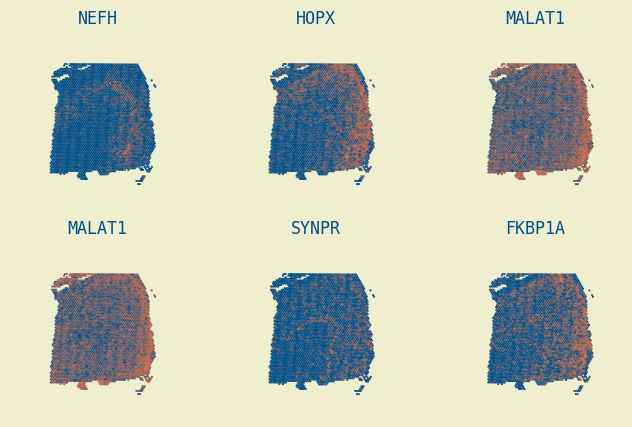

In [59]:
W = '#efefd0'
B = '#004e89'
mpl.rcParams['text.color']       = B
mpl.rcParams['axes.labelcolor']  = W
mpl.rcParams['axes.edgecolor']   = W
mpl.rcParams['axes.facecolor']   = W
mpl.rcParams['figure.facecolor'] = W
mpl.rcParams['xtick.color']      = W
mpl.rcParams['ytick.color']      = W
mpl.rcParams['font.family']      = "monospace"

colors    = [B, "#ff6b35"]
cmap_name = "balck_yellow"
myCMAP    = LinearSegmentedColormap.from_list(cmap_name, colors)

_, axs = plt.subplots(2, 3, figsize=(8, 5))
for i, gene_id in enumerate([32537, 7603, 18002, 18002, 6087, 29192]):
    ax = axs[i//3][i%3]
    plot_spatial_scatter(
        scdata, 
        np.log(get_gene_data(scdata, gene_id)+1), 
        ax           = ax, 
        cmap         = myCMAP, 
        spines_color = W, 
        size         = 1.5, 
        shape        = "square")
    ax.set_title(f"{gene_names[gene_id]}")

plt.savefig(".\\presentazione\\on_trend", bbox_inches='tight', dpi=1000)

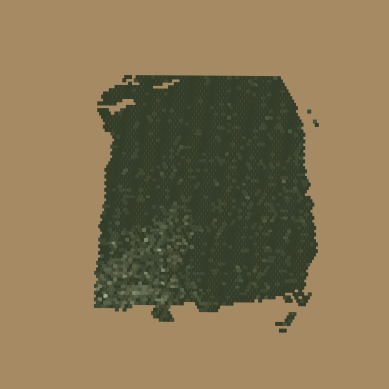

In [19]:

plot_spatial_scatter(
    scdata, 
    get_gene_data(scdata, 888), 
    cmap         = myCMAP, 
    spines_color = W, 
    size         = 1.5, 
    shape        = "square")
plt.savefig("something", dpi=500)

In [27]:
scdata     = load_data()
smallest   = select_top_spatially_variable_genes(scdata, 15000, 200, 15000)
array_data = scdata.X.toarray().T[smallest]
smallest.shape

c:\Users\Workstation\magistrale\algo_ai\Lib\site-packages\anndata\_core\anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
c:\Users\Workstation\magistrale\algo_ai\Lib\site-packages\anndata\_core\anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


(5803,)

In [1181]:
# array_data = array_data[array_data.sum(axis=1) >= 50]
array_data = array_data[smallest]

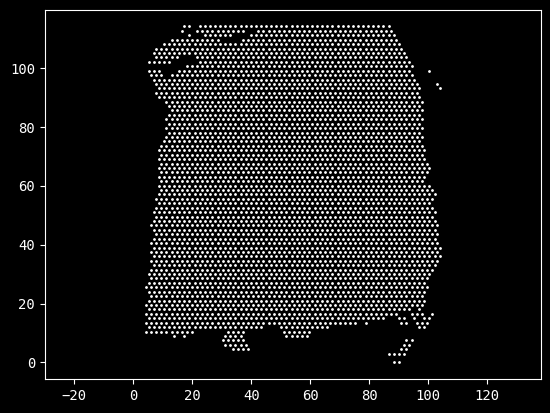

In [28]:
m = {"x": index_to_cart[:, 0], "y": index_to_cart[:, 1], "total_counts": array_data.sum(axis=0)}
sample_info = pd.DataFrame(m)

plt.scatter(sample_info['x'], sample_info['y'], c=W, s=1);
plt.axis('equal');

In [29]:
norm_expr  = NaiveDE.stabilize(array_data)
resid_expr = NaiveDE.regress_out(sample_info, norm_expr, 'np.log(total_counts)').T

In [30]:
df = pd.DataFrame(resid_expr.tolist())
df.shape

(3639, 5803)

In [65]:
# sample_resid_expr = resid_expr.sample(n=1000, axis=0, random_state=1)

X       = sample_info[['x', 'y']]
results = SpatialDE.run(X.to_numpy(), df)

Models: 100%|██████████| 10/10 [12:01<00:00, 72.15s/it]
c:\Users\Workstation\magistrale\algo_ai\Lib\site-packages\SpatialDE\base.py:310: FutureWarning: The provided callable <built-in function max> is currently using SeriesGroupBy.max. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "max" instead.
  model_results = model_results[model_results.groupby(['g'])['max_ll'].transform(max) == model_results['max_ll']]
c:\Users\Workstation\magistrale\algo_ai\Lib\site-packages\SpatialDE\util.py:20: FutureWarning: Series.ravel is deprecated. The underlying array is already 1D, so ravel is not necessary.  Use `to_numpy()` for conversion to a numpy array instead.
  pv = pv.ravel()  # flattens the array in place, more efficient than flatten()


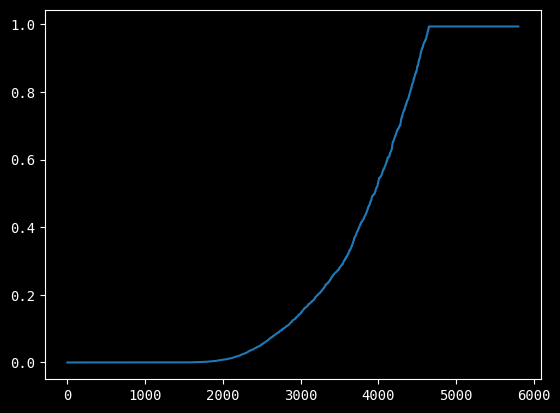

In [85]:
# plt.hist(results["qval"], bins=100)
plt.plot(sorted(results["qval"]))
plt.show()

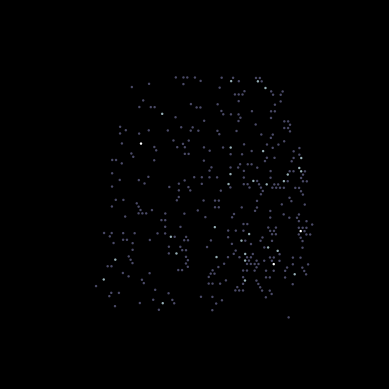

In [74]:
g = results.sort_values("qval", ascending=True)["g"].to_numpy()

plot_spatial_scatter(scdata, get_gene_data(scdata, smallest[g[-150]]))

In [103]:
g = results[(results["qval"] < 0.3)]["g"].to_numpy()

np.save("spatially_variable_genes", smallest[g])

In [130]:
var_genes = np.load("spatially_variable_genes.npy")

In [131]:
scdata     = load_data()
array_data = scdata.X.toarray().T

c:\Users\Workstation\magistrale\algo_ai\Lib\site-packages\anndata\_core\anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
c:\Users\Workstation\magistrale\algo_ai\Lib\site-packages\anndata\_core\anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


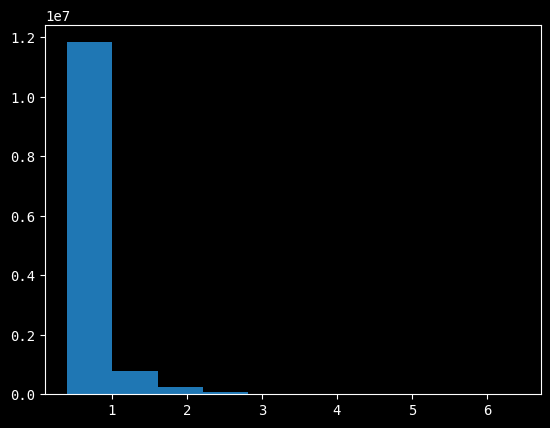

In [ ]:
vg_array_data = array_data[var_genes]
vg_array_data = NaiveDE.stabilize(vg_array_data)

plt.hist(vg_array_data.reshape(-1), bins=10)
plt.show()

True

In [132]:
import numpy as np
import matplotlib.pyplot as plt

def hermite_interpolation(x):
    return 3 * x**2 - 2 * x**3

def sigmoid_interpolation(x, k=15):
    return 1/(1+np.exp(-k*(x-0.5)))

In [67]:
from sklearn.mixture import GaussianMixture
from scipy.stats import norm, expon

def MoG_filter(gene_data):
    gm        = GaussianMixture(n_components=2, random_state=0).fit(gene_data.reshape(-1, 1))
    gene_data = gm.predict(gene_data.reshape(-1, 1))
    m1, m2    = gm.means_
    if m2 < m1:
        gene_data = 1 - gene_data
    return gene_data

def transform_MoG2(gene_data):

    # gene_data = (gene_data - np.min(gene_data)) / (np.max(gene_data) - np.min(gene_data))
    # gene_data = sigmoid_interpolation(gene_data)

    lambd = len(gene_data) / (gene_data.sum())
    half  = expon.ppf(0.5, scale=1/lambd)

    gene_data = opt_mean_filter_iterated(gene_data, 10)

    mask = gene_data > half
    gene_data[mask]                 = 1
    gene_data[np.logical_not(mask)] = 0
    gene_data = expansion_filter_iterated(gene_data, 5)

    # gene_data = opt_mean_filter_iterated(gene_data, 5)
    # gene_data = max_filter(gene_data)
    # gene_data = max_filter(gene_data)
    # gene_data = opt_mean_filter_iterated(gene_data, 10)
    # gene_data = MoG_filter(gene_data)
    # gene_data = expansion_filter_iterated(gene_data, 5)
    
    return gene_data

# gene_data = get_gene_data(scdata, 14596)
# gene_data = transform_MoG2(gene_data)
# plot_spatial_scatter(scdata, gene_data)

In [47]:
from scipy.stats import expon

def normalize(gene_data):
    return (gene_data - gene_data.min()) / (gene_data.max() - gene_data.min())

lambdas = []

array_data = scdata.X.toarray().T

for gene_id in smallest:
    gene_data  = array_data[gene_id]

    # gene_data = gene_data.astype(int)
    # gene_data = normalize(gene_data)
    lambd     = len(gene_data) / (gene_data.sum())
    lambdas.append(lambd)
    # half      = np.ceil(expon.ppf(0.5, scale=1/lambd))
    # gene_data[gene_data<half] = 0

    # print(gene_id)
    # gene_data = transform_MoG(gene_data, 3, 1)
    # plot_spatial_scatter(scdata, gene_data)

In [104]:
import scipy.stats as stats

data = array_data[smallest[0]]

# 2. Statistical Tests
# Kolmogorov-Smirnov Test

data        = np.array(sorted(data, reverse=True))[50:]
p_estimated = 1 / np.mean(data)
print(p_estimated)

# # 3. Kolmogorov-Smirnov Test
# ks_stat, ks_p_value = stats.kstest(data, 'geom', args=(p_estimated,))
# print(f"KS Test Statistic: {ks_stat}, P-Value: {ks_p_value}")

# data    = data.astype(int)
# heights = np.bincount(data)/len(data)
# x       = np.arange(data.max()+1)
# plt.bar(x, heights, alpha=0.1)
# #plt.bar(x, expo_cdf, alpha=0.1)
# plt.show()



2.7523007179152015


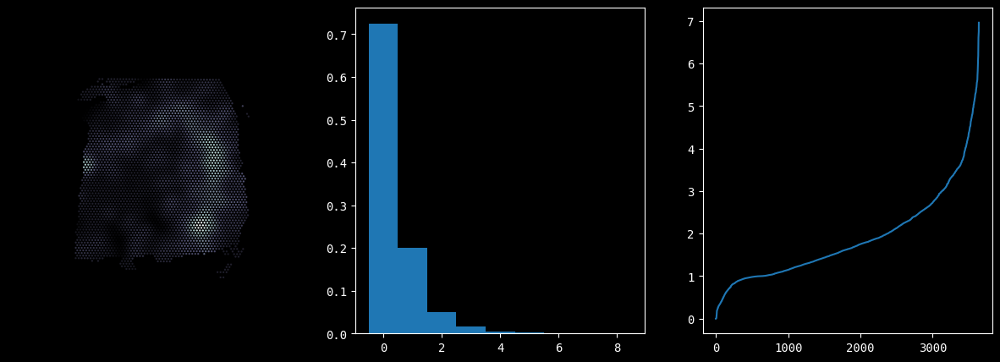

In [228]:

_, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 5))

array_data = scdata.X.toarray().T
data       = array_data[smallest[107]]

#ax3.plot(sorted(data), color="r")

data    = data.astype(int)
heights = np.bincount(data)/len(data)
x       = np.arange(data.max()+1)
ax2.bar(x, heights, alpha=1, width=1)

data = max_filter(data) #opt_mean_filter_iterated(data, 10)
data = max_filter(data)
#data = np.log10(data+1)
data = opt_mean_filter_iterated(data, 5)

plot_spatial_scatter(scdata, data, ax1)

ax3.plot(sorted(data))

plt.show()

In [241]:
from filt import ITNI, ITSNI, VNI

In [703]:
scdata     = load_data()
array_data = scdata.X.toarray().T

smallest = select_top_spatially_variable_genes(scdata, 3000, 1000, 3000)
print(smallest.shape)

array_data = array_data[smallest]

c:\Users\Workstation\magistrale\algo_ai\Lib\site-packages\anndata\_core\anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
c:\Users\Workstation\magistrale\algo_ai\Lib\site-packages\anndata\_core\anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


(633,)


In [610]:
## before calculate neighbour similarity apply filter to all data
for i in range(len(smallest)):
    # array_data[i] = max_filter(array_data[i])
    array_data[i] = opt_mean_filter_iterated(array_data[i], 5)

data_neigh = array_data[:, ITSNI]
data_spot  = array_data

In [571]:
# calculate closest neighbour in eucledian distance
neigh_eucledian_dist = np.sqrt(((data_neigh.T - data_spot.T)**2).sum(axis=2))
best_neigh_eucl      = np.argmin(neigh_eucledian_dist, axis=0)
worst_neigh_eucl     = np.argmax(neigh_eucledian_dist, axis=0)
arange               = np.arange(len(best_neigh_eucl))
best_neigh_eucl_idx  = ITSNI[arange, best_neigh_eucl]
worst_neigh_eucl_idx = ITSNI[arange, worst_neigh_eucl]

# calculate closest neighbour in cosine distance
num                 = (data_neigh.T * data_spot.T).sum(axis=2)
den                 = ((data_neigh**2).sum(axis=0)*(data_spot**2).sum(axis=0).reshape((-1, 1)))
neigh_cos_sim       = num.T / den
best_neigh_cos      = np.argmax(neigh_cos_sim, axis=1)
worst_neigh_cos     = np.argmin(neigh_cos_sim, axis=1)
best_neigh_cos_idx  = ITSNI[arange, best_neigh_cos]
worst_neigh_cos_idx = ITSNI[arange, worst_neigh_cos]

In [572]:
### map from index of spot to cartesian coordinates
index_to_cart = np.zeros((len(scdata.obs), 2))
max_row       = scdata.obs['array_row'].max()
for i, ind in enumerate(scdata.obs.index):
    col = scdata.obs['array_col'][ind]
    row = scdata.obs['array_row'][ind]
    index_to_cart[i, 0] = col             * (np.sqrt(3)/2)
    index_to_cart[i, 1] = (max_row - row) * (3/2)

In [573]:
import networkx as nx

# ITSNI to adjiacency matrix
NSpot, NumNeigh = ITSNI.shape
AM = np.zeros((NSpot, NSpot), dtype=int)
for i in range(NSpot):
    valid_neighbours = list(filter(lambda x: x != -1, ITSNI[i]))
    AM[i, valid_neighbours] = 1

# neigh_idx to adjiacency matrix
neigh_idx = best_neigh_cos_idx
BNAM = np.zeros((NSpot, NSpot), dtype=int)
for i in range(NSpot):
    if neigh_idx[i] != -1:
        BNAM[i, neigh_idx[i]] = 1

# index_to_cart to dictionary of positions
pos = {i:index_to_cart[i] for i in range(NSpot)}


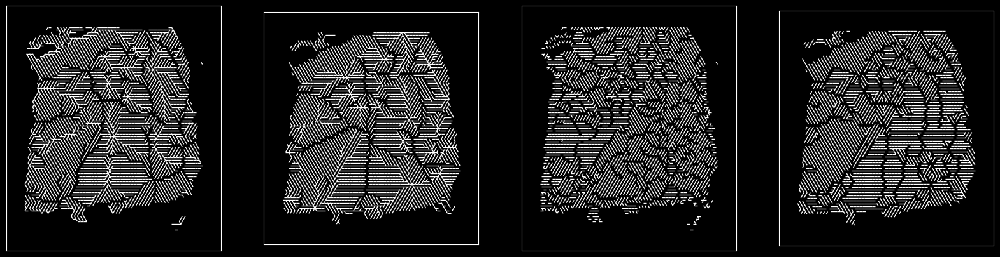

In [574]:
_, axs = plt.subplots(1, 4, figsize=(20, 10))

for ax, neigh_idx in zip(axs, [best_neigh_cos_idx, 
                               worst_neigh_cos_idx, 
                               best_neigh_eucl_idx, 
                               worst_neigh_eucl_idx]):

    BNAM = np.zeros((NSpot, NSpot), dtype=int)
    for i in range(NSpot):
        if neigh_idx[i] != -1:
            BNAM[i, neigh_idx[i]] = 1

    g = nx.Graph(BNAM)
    nx.draw_networkx_edges(g, pos, width=1, edge_color=W, alpha=1, ax=ax)
    ax.set_aspect("equal")
plt.show()

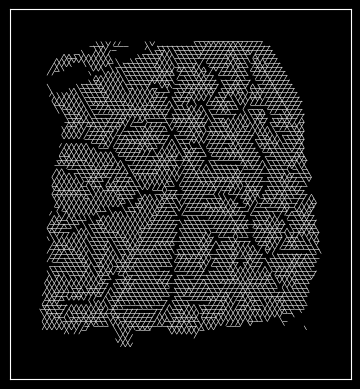

In [704]:
NTOP = 2
# calculate closest neighbour in eucledian distance
neigh_eucledian_dist = np.sqrt(((data_neigh.T - data_spot.T)**2).sum(axis=2))
neigh_eculedian_sort = np.argsort(neigh_eucledian_dist, axis=0)
best_neigh_eucl      = neigh_eculedian_sort[:NTOP]
worst_neigh_eucl     = neigh_eculedian_sort[-NTOP:]
arange               = np.arange(len(best_neigh_eucl[0]))
best_neigh_eucl_idx  = ITSNI[arange, best_neigh_eucl]
worst_neigh_eucl_idx = ITSNI[arange, worst_neigh_eucl]

# calculate closest neighbour in cosine distance
num                 = (data_neigh.T * data_spot.T).sum(axis=2)
den                 = ((data_neigh**2).sum(axis=0)*(data_spot**2).sum(axis=0).reshape((-1, 1)))
neigh_cos_sim       = num.T / den
neigh_cos_sim_sort  = np.argsort(neigh_cos_sim, axis=1)
best_neigh_cos      = neigh_cos_sim_sort[:, -NTOP:]
worst_neigh_cos     = neigh_cos_sim_sort[:, :NTOP]
best_neigh_cos_idx  = ITSNI[arange, best_neigh_cos.T]
worst_neigh_cos_idx = ITSNI[arange, worst_neigh_cos.T]

neigh_idx = best_neigh_cos_idx.T
AM1 = np.zeros((NSpot, NSpot), dtype=int)
for i in range(NSpot):
    valid_neighbours = list(filter(lambda x: x != -1, neigh_idx[i]))
    AM1[i, valid_neighbours] = 1

neigh_idx = worst_neigh_cos_idx.T
AM2 = np.zeros((NSpot, NSpot), dtype=int)
for i in range(NSpot):
    valid_neighbours = list(filter(lambda x: x != -1, neigh_idx[i]))
    AM2[i, valid_neighbours] = 1

AM = AM2

g = nx.Graph(AM)
nx.draw_networkx_edges(g, pos, width=.4, edge_color=W, alpha=1)
plt.gca().set_aspect("equal")
plt.savefig("something", dpi=500)

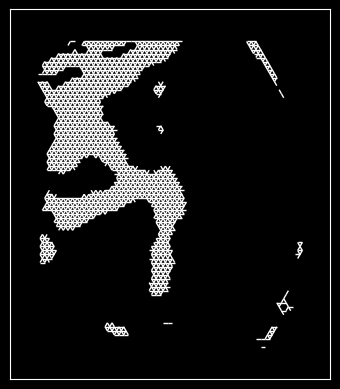

In [706]:
# plt.hist(neigh_cos_sim.reshape(-1), bins=100)
# plt.show()

mask = (neigh_cos_sim > np.percentile(neigh_cos_sim, 75)).astype(int) * ITSNI
AM = np.zeros((NSpot, NSpot), dtype=int)
for i in range(NSpot):
    valid_neighbours = list(filter(lambda x: x>=1, mask[i]))
    AM[i, valid_neighbours] = 1

g = nx.Graph(AM)
nx.draw_networkx_edges(g, pos, width=1, edge_color=W, alpha=1)
plt.gca().set_aspect("equal")

In [717]:
mu  = array_data.mean().reshape(-1, 1)
std = array_data.std().reshape(-1, 1)

norm_array_data = (array_data - mu)/std

In [ ]:
scan = HDBSCAN()
labels = scan.fit_predict(array_data.T)
print((np.unique(labels)))

[-1]


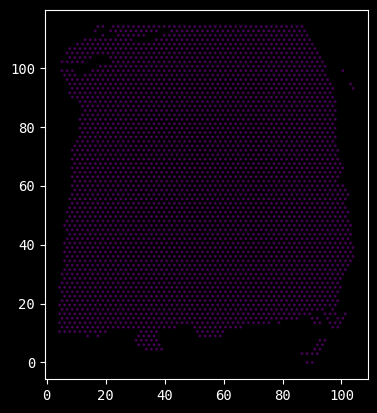

In [721]:
# scan = DBSCAN(eps=25)
# labels = scan.fit_predict(array_data.T)
# print(len(np.unique(labels)))

plt.scatter(index_to_cart[:,0], index_to_cart[:,1], s=1, c=labels)
plt.gca().set_aspect("equal")
plt.show()

3


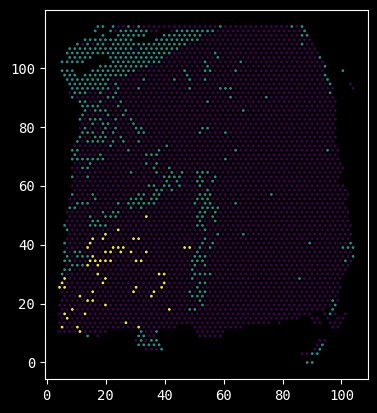

In [756]:
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

mu              = array_data.mean().reshape(-1, 1)
std             = array_data.std().reshape(-1, 1)
norm_array_data = (array_data - mu)/std

pca = PCA(n_components=100)
data_pca = pca.fit_transform(norm_array_data.T)

scan   = HDBSCAN()
labels = scan.fit_predict(data_pca)
print(len(np.unique(labels)))

plt.scatter(index_to_cart[:,0], index_to_cart[:,1], s=1, c=labels)
plt.gca().set_aspect("equal")
plt.show()

In [764]:
from scipy.stats import nbinom

scdata     = load_data()
array_data = scdata.X.toarray().T

smallest = select_top_spatially_variable_genes(scdata, 3000, 1000, 3000)
print(smallest.shape)

array_data = array_data[smallest]

c:\Users\Workstation\magistrale\algo_ai\Lib\site-packages\anndata\_core\anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
c:\Users\Workstation\magistrale\algo_ai\Lib\site-packages\anndata\_core\anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


(633,)


-10202.257384576034


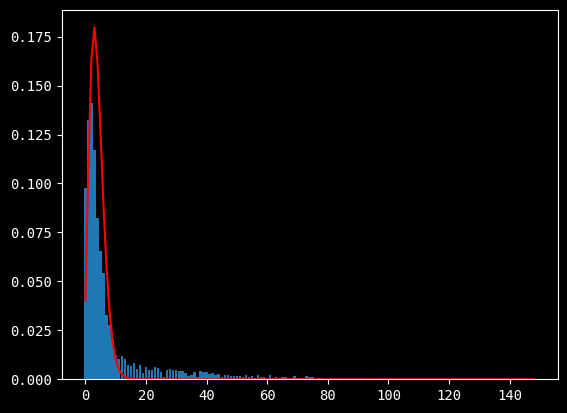

In [779]:
gdata = array_data[1]
gdata = gdata.astype(int)

bins = np.bincount(gdata)/len(gdata)
x    = np.arange(gdata.max()+1)
plt.bar(x, bins)

p   = 0.7
n   = 9

log_lh = -np.log(nbinom.pmf(gene_data, n, p)).sum()
print(log_lh)

nb_pmf = nbinom.pmf(x, n, p)
plt.plot(x, nb_pmf, "r")

1.0 0.2032500758767132


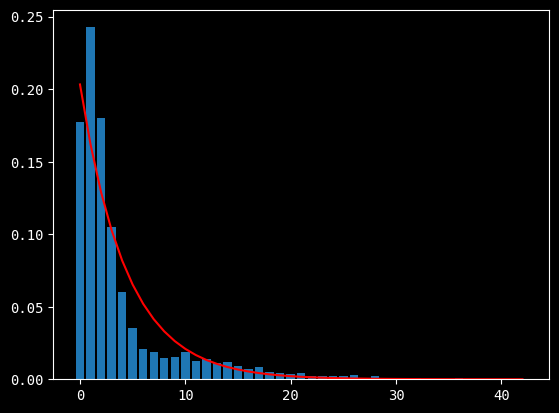

In [ ]:
from scipy.optimize import minimize, Bounds
import scipy.optimize


def negative_log_likelyhood(data, n, p):
    return - np.log(nbinom.pmf(data, n, p)).sum()

gdata = array_data[10]
gdata = gdata.astype(int)

objective_function = lambda params: negative_log_likelyhood(gdata, params[0], params[1])

init_params = [1, 0.5]
result      = minimize(objective_function, x0=init_params, method='Nelder-Mead', bounds=[(1, gdata.max()), (0, 1)])

n, p = result.x

print(n, p)

bins = np.bincount(gdata)/len(gdata)
x    = np.arange(gdata.max()+1)
plt.bar(x, bins)
nb_pmf = nbinom.pmf(x, n, p)
plt.plot(x, nb_pmf, "r")

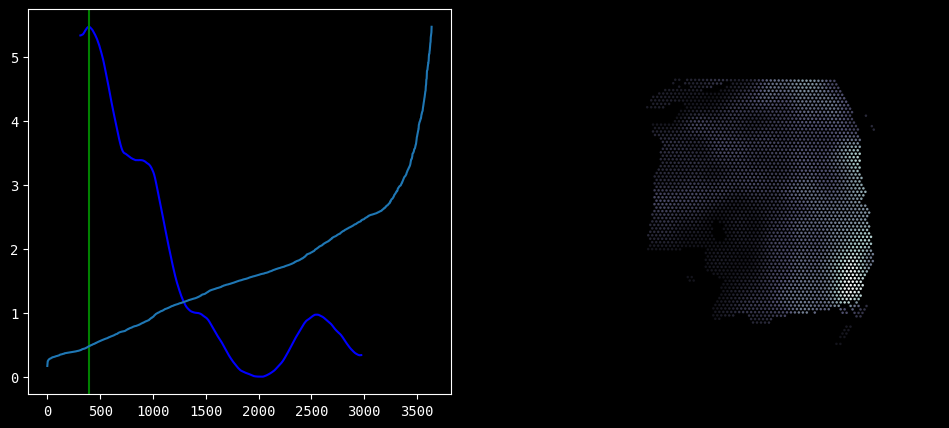

In [1082]:
def empirical_derivative(data, window=5):
    L = len(data)
    d = np.zeros((L-2*window))
    for i in range(window, L-window):
        l = np.mean(data[i-window:i])
        r = np.mean(data[i:i+window])
        d[i-window] = r/l 
    return d

def smooth(data, window_size):
    kernel   = np.ones(window_size) / window_size  
    smoothed = np.convolve(data, kernel, mode='valid') 
    return smoothed

gdata = array_data[130]
gdata = gdata.astype(int)
L     = len(gdata)

_, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

smooth_window = 1
filt_gdata    = opt_mean_filter_iterated(gdata, 10)
sf_gdata      = sorted(filt_gdata)
sf_gdata      = smooth(sf_gdata, smooth_window)

window  = 300
der     = empirical_derivative(sf_gdata, window)
dec     = der[:-1] > der[1:]
dec_idx = np.where(~dec)[0][0]
enc     = der[:-1] < der[1:]
enc_idx = L - 2*window - np.where(~(enc[::-1]))[0][0]
derx    = np.arange(window, L-window)
der     = (der - der.min())*(filt_gdata.max()/(der.max()-der.min()))
best    = dec_idx + window + np.argmax(der[dec_idx:enc_idx])

# ax1.plot(derx[:dec_idx], der[:dec_idx], "r")
# ax1.plot(derx[enc_idx:], der[enc_idx:], "r")
ax1.plot(derx[dec_idx:enc_idx], der[dec_idx:enc_idx], "b")
ax1.axvline(best, color="g")
ax1.plot(sf_gdata)
plot_spatial_scatter(scdata,(filt_gdata>sf_gdata[best]).astype(int)*filt_gdata, ax=ax2)
plt.show()

In [1084]:
scdata     = load_data()
array_data = scdata.X.toarray().T

smallest = select_top_spatially_variable_genes(scdata, 3000, 1000, 3000)
print(smallest.shape)

c:\Users\Workstation\magistrale\algo_ai\Lib\site-packages\anndata\_core\anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
c:\Users\Workstation\magistrale\algo_ai\Lib\site-packages\anndata\_core\anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


(633,)


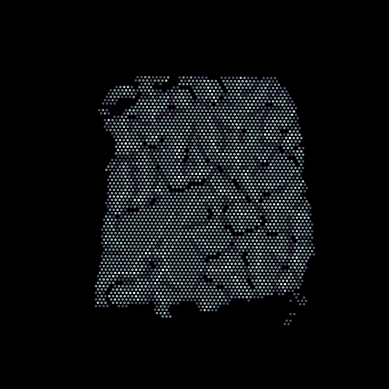

In [1127]:
def entropy(data):
    _, counts     = np.unique(data, return_counts=True)
    probabilities = counts / len(data)
    entropy       = -np.sum(probabilities * np.log2(probabilities))
    return entropy

gdata = array_data[smallest[1]]
gdata = opt_mean_filter_iterated(gdata, 5)

neigh_gdata = gdata[ITSNI]

dec = ((neigh_gdata < gdata.reshape((-1, 1))).astype(int) * VNI[:, 1:]).astype(bool)

AM = np.zeros((6, NSpot, NSpot), dtype=int)
cdata = np.zeros((NSpot))

for i in range(NSpot):
    valid_neighbours           = ITSNI[i][dec[i]]
    AM[0, i, valid_neighbours] = 1

    neighs_value = neigh_gdata[i][dec[i]]
    cdata[i]     = entropy(valid_neighbours)

plot_spatial_scatter(scdata, cdata)

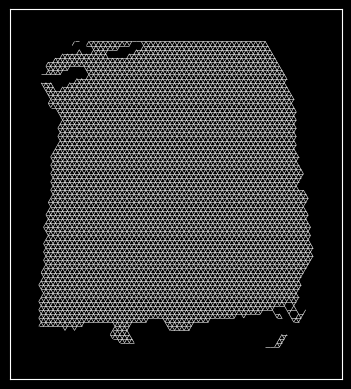

In [1106]:
g = nx.Graph(AM[0])
nx.draw_networkx_edges(g, pos, width=.4, edge_color=W, alpha=1)
plt.gca().set_aspect("equal")

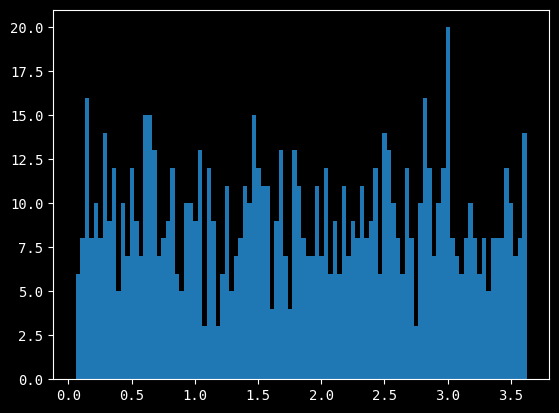

In [48]:
plt.hist(lambdas, bins=100)#, density=True)
#plt.plot(sorted(lambdas))
plt.show()

0.9081961409480129


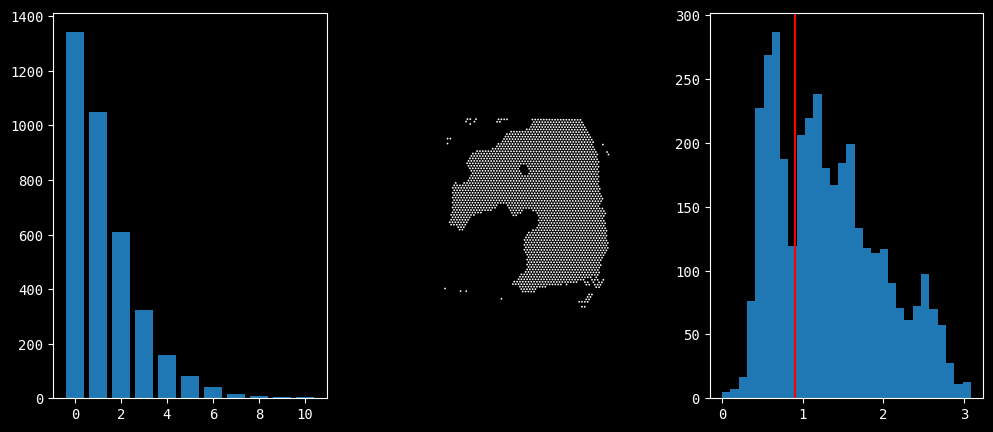

In [66]:
from scipy.stats import expon

gene_id = 6849

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(4*3, 5))

### 0
gene_data = get_gene_data(scdata, gene_id)

gene_data = gene_data.astype(int)
min_value = np.min(gene_data)
max_value = np.max(gene_data)

counts = np.bincount(gene_data - min_value, minlength=(max_value - min_value + 1))
values = np.arange(min_value, max_value + 1)

lambd = len(gene_data) / (gene_data.sum())
half  = expon.ppf(0.5, scale=1/lambd)

print(half)

ax1.bar(values, counts)

### 1
gene_data = get_gene_data(scdata, gene_id)

gene_data = opt_mean_filter_iterated(gene_data, 10)
# gene_data = max_filter(gene_data)
# gene_data = max_filter(gene_data)
# gene_data = opt_mean_filter_iterated(gene_data, 10)
# gene_data = MoG_filter(gene_data)
# gene_data = expansion_filter_iterated(gene_data, 5)

threshold = half

ax3.axvline(threshold, color="r")
ax3.hist(gene_data, bins=30)

mask = gene_data > threshold
gene_data[mask]                 = 1
gene_data[np.logical_not(mask)] = 0
gene_data = expansion_filter_iterated(gene_data, 5)

plot_spatial_scatter(scdata, gene_data, ax2)


# gene_data = opt_mean_filter_iterated(gene_data, 5)
# gene_data = MoG_filter(gene_data)
# gene_data = expansion_filter_iterated(gene_data, 5)

# plot_spatial_scatter(scdata, gene_data, ax3)
# ax3.hist(gene_data, bins="auto")

plt.show()

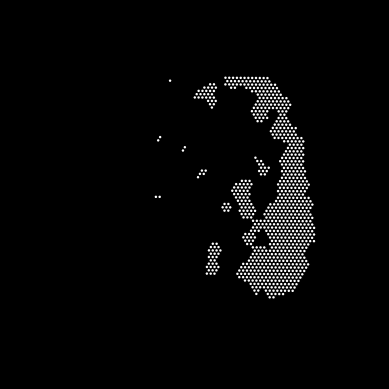

In [111]:

gene_id = 18840

gene_data = get_gene_data(scdata, gene_id)

# gene_data = max_filter(gene_data)

gene_data = normalize(gene_data)
gene_data = opt_mean_filter_iterated(gene_data, 5)
gene_data = np.log(gene_data+1)
gene_data = MoG_filter(gene_data)

plot_spatial_scatter(scdata, gene_data)
plt.show()

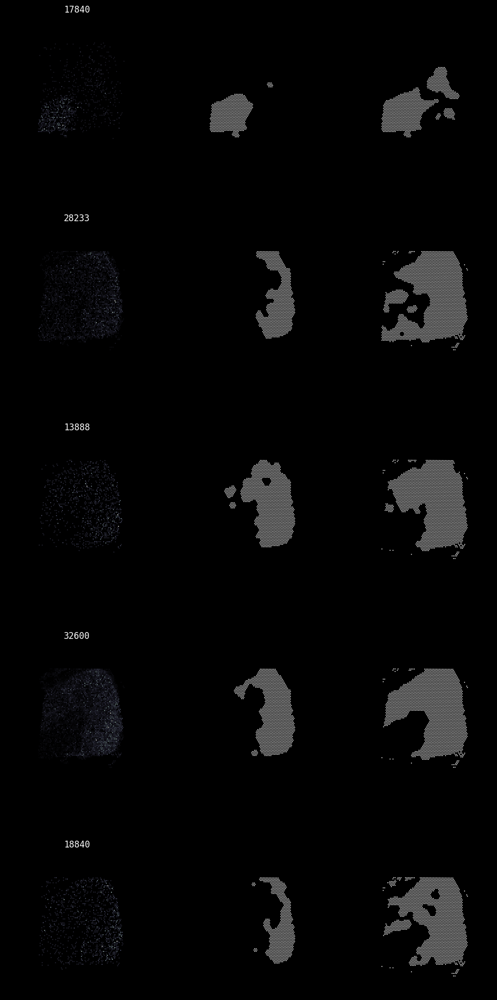

In [68]:
ROWS = 5
COLS = 3
fig, axs = plt.subplots(nrows=ROWS, ncols=COLS, figsize=(COLS*4, ROWS*5))

for i in range(ROWS):
    ax_row    = axs[i]
    gene_id   = choice(smallest)
    gene_data = get_gene_data(scdata, gene_id)
 
    plot_spatial_scatter(scdata, gene_data,                       ax_row[0])
    plot_spatial_scatter(scdata, transform_MoG(gene_data, 10, 5), ax_row[1])
    plot_spatial_scatter(scdata, transform_MoG2(gene_data),       ax_row[2])

    ax_row[0].set_title(f"{gene_id}")

In [19]:
class ClusterCollector():

    def __init__(self, size, capacity=100):
        self.data = np.zeros((capacity, size), dtype=int)
        self.idxs = np.zeros((capacity), dtype=int)
        self.size = size
        self.capacity = capacity
        self.top      = 0

    def expand(self):
        self.data     = np.concatenate((self.data, np.zeros((100, self.size), dtype=int)), axis=0) 
        self.idxs     = np.concatenate((self.idxs, np.zeros((100), dtype=int)), axis=0) 
        self.capacity = self.capacity + 100

    def contract(self):
        self.data = self.data[:self.top]
        self.idxs = self.idxs[:self.top]

    def add(self, clusters, idx):
        n_clusters, size = clusters.shape

        if self.top + n_clusters > self.capacity:
            self.expand()

        self.data[self.top:self.top+n_clusters] = clusters
        self.idxs[self.top:self.top+n_clusters] = idx
        self.top = self.top+n_clusters

colors = ['red', 'green', 'blue', 'yellow', 'cyan', 'magenta', 'black', 'white', 'orange', 'purple', 'brown', 'pink']

max_col     = scdata.obs['array_col'].max()
max_row     = scdata.obs['array_row'].max()
hex_to_cart = np.zeros((max_row+2, max_col+2, 2))

for i, ind in enumerate(scdata.obs.index):
    col = scdata.obs['array_col'][ind]-1
    row = scdata.obs['array_row'][ind]-1

    x, y = col*(math.sqrt(3)/2), row*(3/2)
    hex_to_cart[row, col] = [y, x]

coord_to_idx = np.zeros((max_row+2, max_col+2), dtype=int)-1
for i, ind in enumerate(scdata.obs.index):
    coord_to_idx[scdata.obs['array_row'][ind]-1, scdata.obs['array_col'][ind]-1] = i

def cluster_spot(gene_data, eps=5, min_samples=5, min_cluster_size=15):    
    transf_gene_data = transform_MoG(gene_data, 10, 5)

    cols = (scdata.obs['array_col'][transf_gene_data == 1]).values-1
    rows = (scdata.obs['array_row'][transf_gene_data == 1]).values-1
    
    points = hex_to_cart[rows, cols]

    db = DBSCAN(eps=eps, min_samples=min_samples).fit(points)

    labels     = db.labels_
    n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
    n_noise    = list(labels).count(-1)
    # print(f"e={eps}, k={n_clusters}, ns={n_noise}")
    
    cl_gene_data = np.zeros((n_clusters, len(gene_data)), dtype=int)
    
    for l in range(n_clusters):
        if l == -1:
            continue
        idxs    = np.where(labels == l)
        cl_cols = cols[idxs]
        cl_rows = rows[idxs]
        gene_data_idxs  = coord_to_idx[cl_rows, cl_cols]
        cl_gene_data[l, gene_data_idxs] = 1

    cl_gene_data = cl_gene_data[cl_gene_data.sum(axis=1) > min_cluster_size]

    return cl_gene_data

In [255]:
import time

array_data = scdata.X.toarray().T
collector  = ClusterCollector(len(array_data[0]))

st = time.time()

clusts = 0
max_idx = 300
for idx in range(len(smallest)):

    if idx % 100 == 0:
        print(f"{idx} / {len(smallest)}")
    
    gene_data = array_data[smallest[idx]]
    cl_data   = cluster_spot(gene_data, eps=7)
    collector.add(cl_data, smallest[idx])
collector.contract()

et = time.time()
print('Execution time:', et - st, 'seconds')

0 / 789
100 / 789
200 / 789
300 / 789
400 / 789
500 / 789
600 / 789
700 / 789
Execution time: 80.95447039604187 seconds


In [256]:
cluster_data, cluster_idxs = collector.data, collector.idxs
cluster_data.shape, cluster_idxs.shape

((1521, 3639), (1521,))

In [257]:
clusterer = hdbscan.HDBSCAN(min_cluster_size=25, cluster_selection_epsilon=25)
clusterer.fit(cluster_data)
labels     = clusterer.labels_
n_clusters = len(set(labels)) - (1 if -1 in labels else 0)

2

In [258]:
noise_clusters_mask = (labels==-1)
noise_idxs          = np.unique(cluster_idxs[noise_clusters_mask])
# noise_idxs_mask     = (np.array([cluster_idxs == idx for idx in noise_idxs]).sum(axis=0)>0)

print("noise: ", len(noise_idxs))

for nidx in noise_idxs:
    nidx_mask = (cluster_idxs == nidx)

    nidx_noise_cl_mask = np.logical_and(nidx_mask, noise_clusters_mask)
    nidx_clean_cl_mask = np.logical_and(np.logical_xor(nidx_mask, noise_clusters_mask), nidx_mask)

    noise_area = cluster_data[nidx_noise_cl_mask].sum()
    clean_area = cluster_data[nidx_clean_cl_mask].sum()

    noise_perc = noise_area/(noise_area+clean_area)

    if noise_perc < .80: print(nidx, f": {100*noise_perc:.2f}%")
    
    # print(f"{100*noise_perc:.2f}%")

noise:  85
1931 : 77.05%
14651 : 72.68%
20872 : 59.90%
22392 : 76.38%
32236 : 79.98%


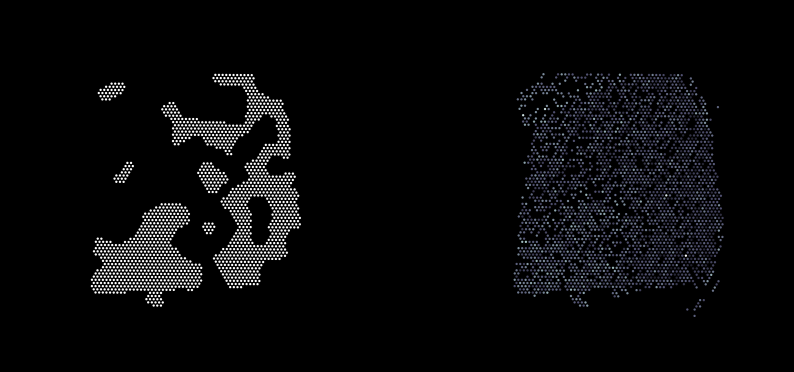

In [259]:
gene_data = get_gene_data(scdata, 20872)
f, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))
plot_spatial_scatter(scdata, transform_MoG(gene_data, 10, 5), ax1)
plot_spatial_scatter(scdata, gene_data, ax2)

---

sub set similarity

---

In [278]:
cl_data_dot = cluster_data @ cluster_data.T

In [285]:
cl_data_sum = cluster_data.sum(axis=1)

In [289]:
cl_subset_sim = cl_data_dot / cl_data_sum

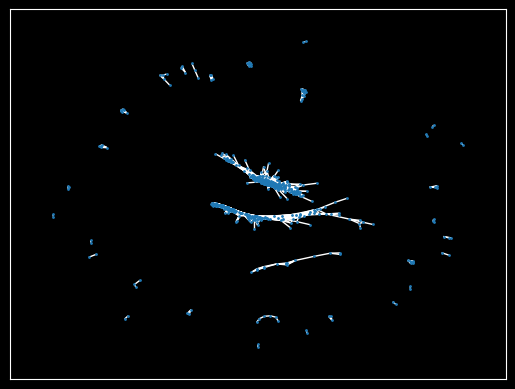

In [471]:
ARC_THRESHOLD  = 0.90

cl_conn_matrix = (cl_subset_sim > ARC_THRESHOLD).astype(int)

np.fill_diagonal(cl_conn_matrix, 0)

cl_eq_conn_matrix = ((cl_conn_matrix + cl_conn_matrix.T) == 2).astype(int)

# print(np.all(cl_eq_conn_matrix == cl_eq_conn_matrix.T))

with_conn = cl_eq_conn_matrix.sum(axis=0) != 0

cl_eq_conn_matrix = cl_eq_conn_matrix[with_conn][:, with_conn]

G = nx.Graph(cl_eq_conn_matrix)

nx.draw_networkx(G, pos=nx.spring_layout(G), with_labels=False, edge_color=W, node_size=1)

# cl_conn_matrix = np.maximum(cl_conn_matrix, cl_conn_matrix.T)

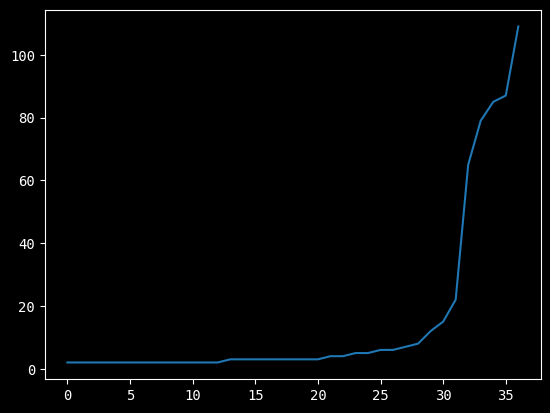

In [474]:
comm = nx.community.louvain_communities(G, seed=123)

comm = list(comm)
plt.plot([len(c) for c in sorted(comm, key=len)])


In [465]:
cut_to_data = np.stack([np.cumsum(with_conn) * with_conn-1, np.arange(len(with_conn))])
cut_to_data = cut_to_data[1, cut_to_data[0] != -1]

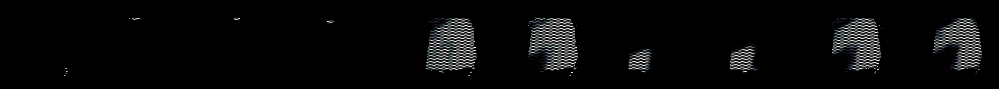

In [466]:
comm     = sorted(comm, key=len)[-10:]
n_comm   = len(comm)
fig, axs = plt.subplots(nrows=1, ncols=n_comm, facecolor=B, figsize=(n_comm*5, 5))

for ax, c in zip(axs, comm):
    cl = cluster_data[cut_to_data[list(c)]]
    plot_spatial_scatter(scdata, cl.mean(axis=0), ax)

In [467]:
import networkx as nx

G = nx.Graph(cl_conn_matrix)

In [380]:
# comm = nx.community.louvain_communities(G, seed=123)
# comm = nx.community.label_propagation_communities(G)
comm = nx.community.asyn_fluidc(G, 4)
comm = list(comm)
[len(c) for c in comm]

[213, 714, 188, 406]

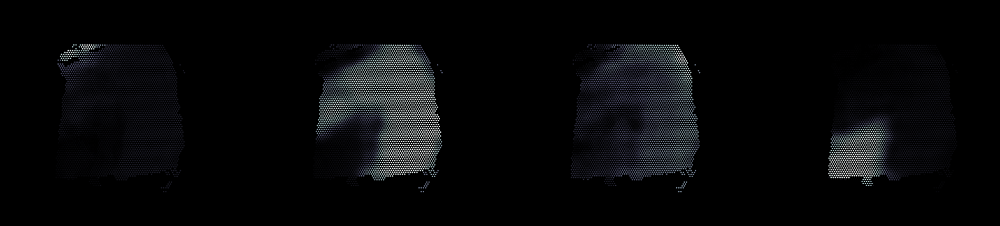

In [381]:
n_comm   = len(comm)
fig, axs = plt.subplots(nrows=1, ncols=n_comm, facecolor=B, figsize=(n_comm*5, 5))

for ax, c in zip(axs, comm):
    cl = cluster_data[list(c)]
    plot_spatial_scatter(scdata, cl.mean(axis=0), ax)

In [377]:
noise_clusters_mask                = np.zeros(len(cluster_data[:, 0]), dtype=bool)
noise_clusters_mask[list(comm[2])] = True

noise_idxs = np.unique(cluster_idxs[noise_clusters_mask])
# noise_idxs_mask     = (np.array([cluster_idxs == idx for idx in noise_idxs]).sum(axis=0)>0)

print("noise: ", len(noise_idxs))

noise = []

for nidx in noise_idxs:
    nidx_mask = (cluster_idxs == nidx)

    nidx_noise_cl_mask = np.logical_and(nidx_mask, noise_clusters_mask)
    nidx_clean_cl_mask = np.logical_and(np.logical_xor(nidx_mask, noise_clusters_mask), nidx_mask)

    noise_area = cluster_data[nidx_noise_cl_mask].sum()
    clean_area = cluster_data[nidx_clean_cl_mask].sum()

    noise_perc = noise_area/(noise_area+clean_area)

    if noise_perc > .30: 
        noise.append(nidx)
    
noise

noise:  59


[27,
 1085,
 10548,
 10564,
 10606,
 10607,
 12632,
 15326,
 19604,
 20422,
 20841,
 23552,
 24727,
 25654,
 27588,
 28822,
 31416,
 32395,
 32520,
 33360]

----

In [124]:
eps = 20
db  = DBSCAN(eps=eps, min_samples=20).fit(cluster_data)

labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_    = list(labels).count(-1)

print(f"e={eps}, k={n_clusters_}, ns={n_noise_}")

e=20, k=3, ns=438


1183
281
43
438


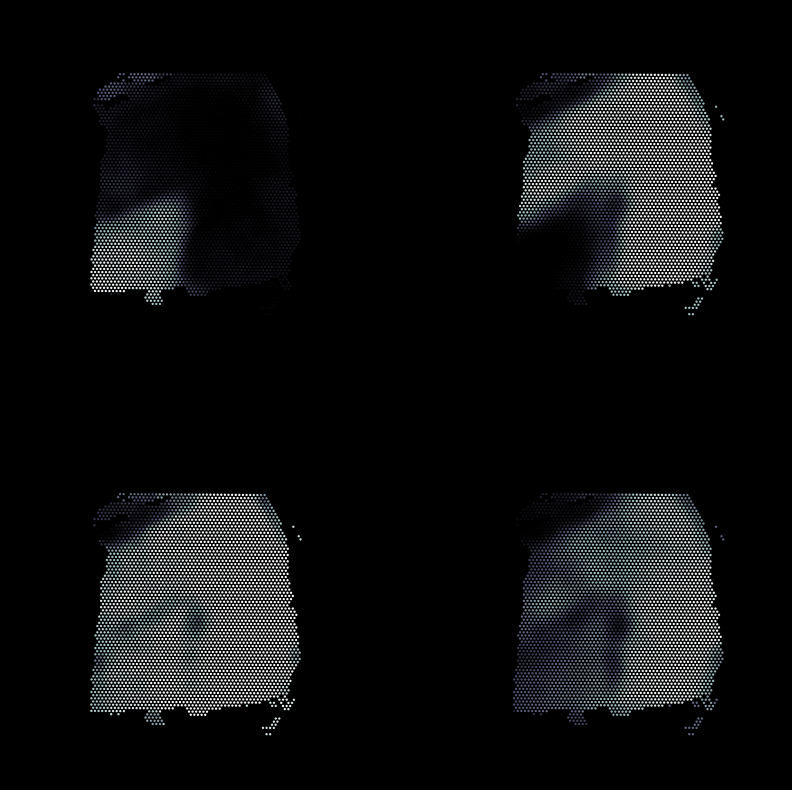

In [126]:
l0 = cluster_data[labels ==  0]
l1 = cluster_data[labels ==  1]
l2 = cluster_data[labels ==  2]
l3 = cluster_data[labels == -1]

print(len(l0))
print(len(l1))
print(len(l2))
print(len(l3))

fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(nrows=2, ncols=2, facecolor=B, figsize=(10, 10))
plot_spatial_scatter(scdata, l0.mean(axis=0), ax1)
plot_spatial_scatter(scdata, l1.mean(axis=0), ax2)
plot_spatial_scatter(scdata, l2.mean(axis=0), ax3)
plot_spatial_scatter(scdata, l3.mean(axis=0), ax4)
plt.show()

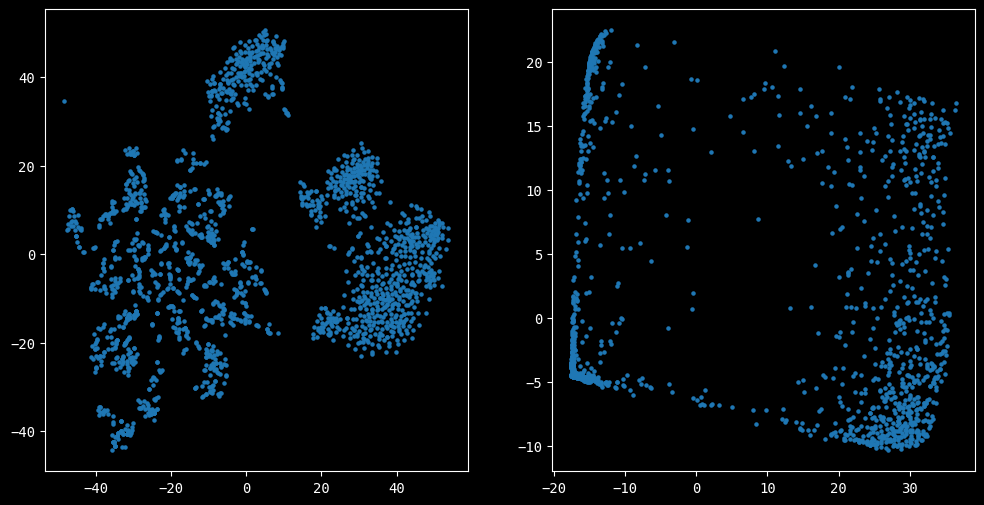

In [136]:
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))

tsne      = TSNE(n_components=2, random_state=42)
data_tsne = tsne.fit_transform(cluster_data)

pca      = PCA(n_components=2)
data_pca = pca.fit_transform(cluster_data)

ax1.scatter(data_tsne[:, 0], data_tsne[:, 1], s=5)
ax2.scatter(data_pca[:, 0],  data_pca[:, 1],  s=5)

plt.show()

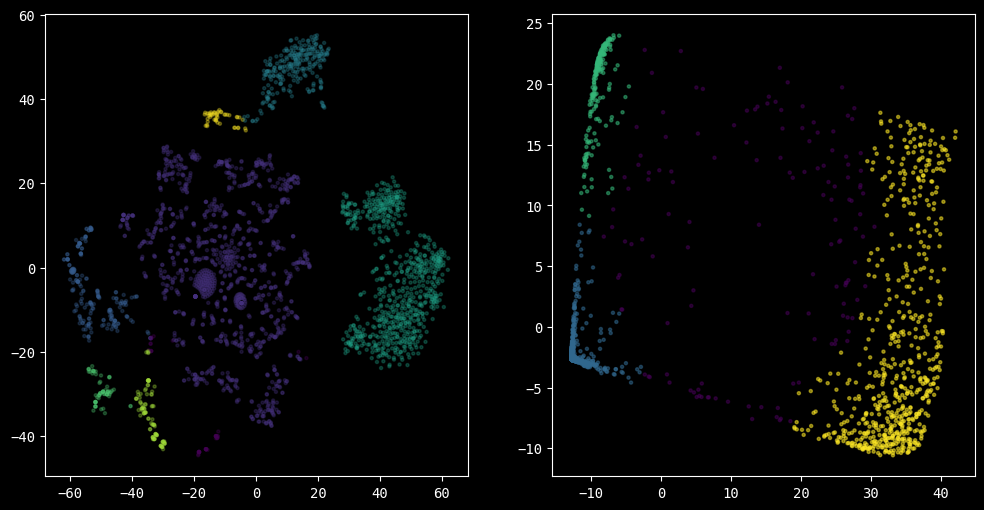

In [51]:
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))

dbscan     = DBSCAN(eps=3, min_samples=20)
labels_pca = dbscan.fit_predict(data_pca)

dbscan      = DBSCAN(eps=7, min_samples=40)
labels_tsne = dbscan.fit_predict(data_tsne)

ax1.scatter(data_tsne[:, 0], data_tsne[:, 1], c=labels_tsne, s=5, alpha=0.3)
ax2.scatter(data_pca[:, 0],  data_pca[:, 1],  c=labels_pca,  s=5, alpha=0.5)

plt.show()

noise:  165
k:      2


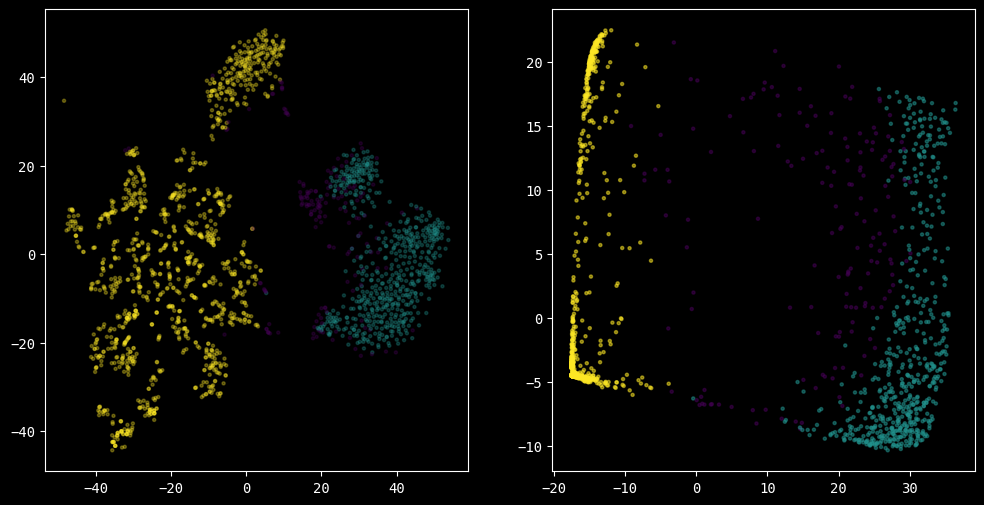

In [167]:
# hdbscan = HDBSCAN(
#             cluster_selection_epsilon = 20, 
#             min_cluster_size          = 20)
# labels  = hdbscan.fit_predict(cluster_data)

clusterer = hdbscan.HDBSCAN(min_cluster_size=20, cluster_selection_epsilon=24)
clusterer.fit(cluster_data)
labels    = clusterer.labels_

print("noise: ", (labels==-1).sum())
print("k:     ", len(set(labels)) - (1 if -1 in labels else 0))

fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))

ax1.scatter(data_tsne[:, 0], data_tsne[:, 1], c=labels, s=5, alpha=0.3)
ax2.scatter(data_pca[:, 0],  data_pca[:, 1],  c=labels, s=5, alpha=0.5)

plt.show()

<Axes: ylabel='$\\lambda$ value'>

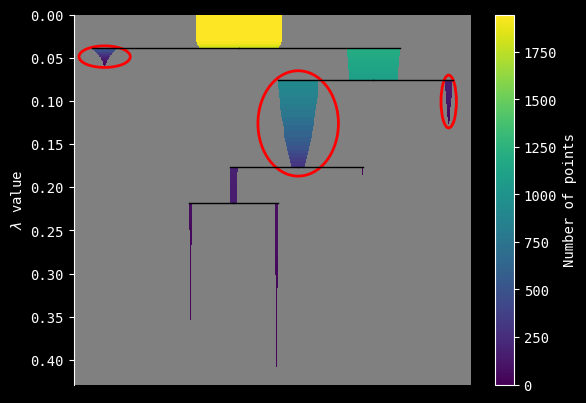

In [168]:
plt.gca().set_facecolor("grey")
clusterer.condensed_tree_.plot(cmap='viridis', select_clusters=True)

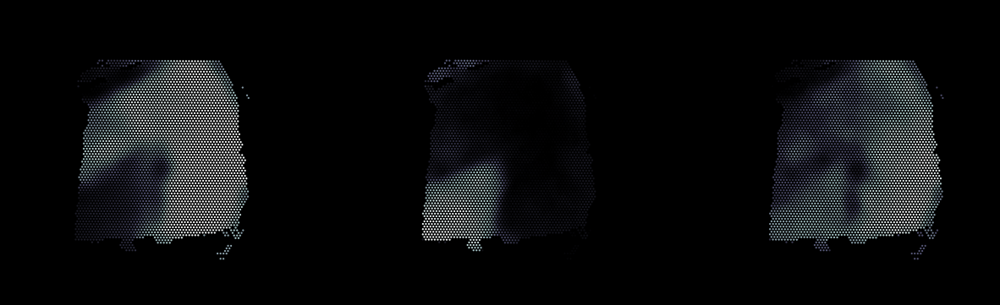

In [150]:
cl0  = cluster_data[labels == 0]
cl1  = cluster_data[labels == 1]
cl2  = cluster_data[labels == -1]

# print(len(tsne_cl0), len(tsne_cl1), len(tsne_cl2), ":", (labels_tsne==-1).sum())

fig, (ax1, ax2, ax3) = plt.subplots(nrows=1, ncols=3, facecolor=B, figsize=(15, 5))
plot_spatial_scatter(scdata, cl0.mean(axis=0), ax1)
plot_spatial_scatter(scdata, cl1.mean(axis=0), ax2)
plot_spatial_scatter(scdata, cl2.mean(axis=0), ax3)
plt.show()

1973 708 0 : 8
706 1693 208 : 82


C:\Users\Workstation\AppData\Local\Temp\ipykernel_27852\1019089118.py:15: RuntimeWarning: Mean of empty slice.
  plot_spatial_scatter(scdata, tsne_cl2.mean(axis=0), ax3)
C:\Users\Workstation\magistrale\algo_ai\Lib\site-packages\numpy\core\_methods.py:121: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(


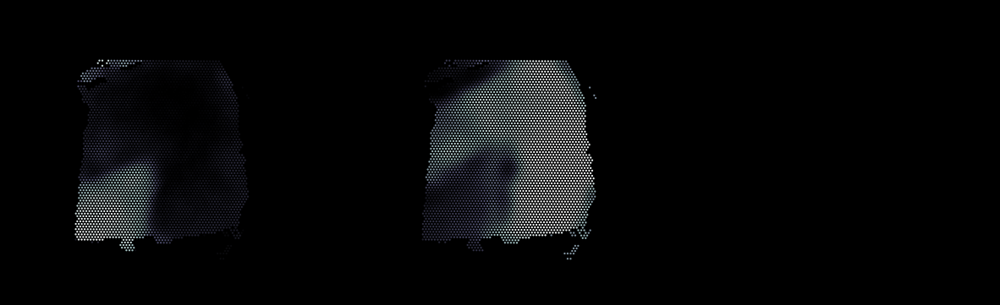

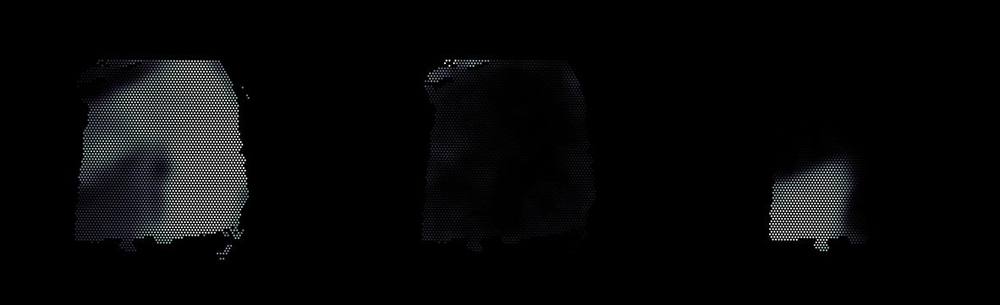

In [58]:
tsne_cl0 = cluster_data[labels_tsne == 0]
tsne_cl1 = cluster_data[labels_tsne == 1]
tsne_cl2 = cluster_data[labels_tsne == 2]

pca_cl0  = cluster_data[labels_pca == 0]
pca_cl1  = cluster_data[labels_pca == 1]
pca_cl2  = cluster_data[labels_pca == 2]

print(len(tsne_cl0), len(tsne_cl1), len(tsne_cl2), ":", (labels_tsne==-1).sum())
print(len(pca_cl0),  len(pca_cl1),  len(pca_cl2), ":", (labels_pca==-1).sum())

fig, (ax1, ax2, ax3) = plt.subplots(nrows=1, ncols=3, facecolor=B, figsize=(15, 5))
plot_spatial_scatter(scdata, tsne_cl0.mean(axis=0), ax1)
plot_spatial_scatter(scdata, tsne_cl1.mean(axis=0), ax2)
plot_spatial_scatter(scdata, tsne_cl2.mean(axis=0), ax3)
plt.show()

fig, (ax1, ax2, ax3) = plt.subplots(nrows=1, ncols=3, facecolor=B, figsize=(15, 5))
plot_spatial_scatter(scdata, pca_cl0.mean(axis=0), ax1)
plot_spatial_scatter(scdata, pca_cl1.mean(axis=0), ax2)
plot_spatial_scatter(scdata, pca_cl2.mean(axis=0), ax3)
plt.show()

----------------------------------------------------------------------------------------------------------------------

In [21]:
transf_data = apply_MoG_to_gene_idxs(scdata, smallest, True)

0 / 300
100 / 300
200 / 300


In [24]:
transf_data = np.load("transformed_data.npy")

for eps in range(200, 250):
    db     = DBSCAN(eps=eps, metric="manhattan").fit(transf_data)
    labels = db.labels_
    
    # Number of clusters in labels, ignoring noise if present.
    n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
    n_noise_    = list(labels).count(-1)

    print(f"e={eps}, k={n_clusters_}, ns={n_noise_}")

e=200, k=3, ns=158
e=201, k=3, ns=158
e=202, k=3, ns=158
e=203, k=3, ns=158
e=204, k=3, ns=157
e=205, k=3, ns=156
e=206, k=3, ns=156
e=207, k=3, ns=156
e=208, k=3, ns=155
e=209, k=3, ns=155
e=210, k=3, ns=155
e=211, k=3, ns=154
e=212, k=3, ns=154
e=213, k=3, ns=152
e=214, k=3, ns=152
e=215, k=3, ns=152
e=216, k=3, ns=151
e=217, k=3, ns=151
e=218, k=3, ns=151
e=219, k=3, ns=150
e=220, k=2, ns=150
e=221, k=2, ns=150
e=222, k=2, ns=150
e=223, k=2, ns=150
e=224, k=2, ns=150
e=225, k=2, ns=150
e=226, k=2, ns=148
e=227, k=2, ns=148
e=228, k=2, ns=148
e=229, k=2, ns=148
e=230, k=2, ns=148
e=231, k=2, ns=148
e=232, k=2, ns=148
e=233, k=2, ns=148
e=234, k=2, ns=147
e=235, k=2, ns=146
e=236, k=2, ns=145
e=237, k=2, ns=143
e=238, k=2, ns=140
e=239, k=2, ns=140
e=240, k=2, ns=140
e=241, k=2, ns=137
e=242, k=2, ns=137
e=243, k=2, ns=136
e=244, k=2, ns=136
e=245, k=2, ns=136
e=246, k=2, ns=136
e=247, k=2, ns=136
e=248, k=2, ns=136
e=249, k=2, ns=135


In [32]:
eps    = 400
db     = DBSCAN(eps=eps, metric="manhattan").fit(transf_data)
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_    = list(labels).count(-1)

print("--------------------------------")
print(f"eps:              {eps}")
print(f"num clusters:     {n_clusters_}")
print(f"num noise points: {n_noise_}")

--------------------------------
eps:              400
num clusters:     2
num noise points: 69


In [33]:
l0 = transf_data[labels ==  0]
l1 = transf_data[labels ==  1]
l3 = transf_data[labels == -1]

print(len(l0))
print(len(l1))
print(len(l3))

fig, (ax1, ax2, ax3) = plt.subplots(nrows=1, ncols=3, facecolor=B, figsize=(15, 5))
plot_spatial_scatter(scdata, (l0.mean(axis=0) > 0.5).astype(int), ax1, cmap=BWCMAP)
plot_spatial_scatter(scdata, (l1.mean(axis=0) > 0.5).astype(int), ax2, cmap=BWCMAP)
plot_spatial_scatter(scdata, l3.mean(axis=0), ax3, cmap=BWCMAP)
plt.show()

132
99
69


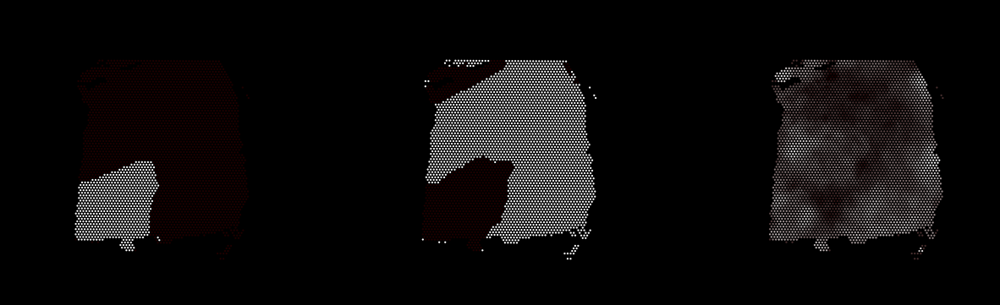

In [34]:
fig, (ax1, ax2, ax3) = plt.subplots(nrows=1, ncols=3, facecolor=B, figsize=(15, 5))
plot_spatial_scatter(scdata, (l0.mean(axis=0) > 0.5).astype(int), ax1, cmap=BWCMAP)
plot_spatial_scatter(scdata, (l1.mean(axis=0) > 0.5).astype(int), ax2, cmap=BWCMAP)
plot_spatial_scatter(scdata, l3.mean(axis=0), ax3, cmap=BWCMAP)
plt.show()

In [22]:
noise_idxs     = np.where(labels == -1)[0]
smallest_noise = smallest[noise_idxs]

In [23]:
np.save(".\\docker\\py38r403\\shared\\noise", smallest_noise)

In [24]:
cl1 = (l0.mean(axis=0) > 0.5).astype(int)
cl2 = (l1.mean(axis=0) > 0.5).astype(int)

transf_data = np.load("transformed_data.npy")

discard = []
redraw = []

TDOWN, TUP = 0.10, 0.85

for gene_noise_id in noise_idxs:
    gene_data = transf_data[gene_noise_id]
    cl1_cov = (gene_data * cl1).sum() / gene_data.sum()
    cl2_cov = (gene_data * cl2).sum() / gene_data.sum()
    if not ((cl1_cov > TUP and cl2_cov < TDOWN) or (cl2_cov > TUP or cl1_cov < TDOWN)):
        discard.append(gene_noise_id)
    else:
        redraw.append(gene_noise_id)
discard = np.array(discard)
redraw  = np.array(redraw)

print(len(discard), "/", len(noise_idxs))
print(len(redraw), "/", len(noise_idxs))

45 / 69
24 / 69


In [25]:
gene_data = transf_data[discard[0]]
cl1_cov = (gene_data * cl1).sum() / gene_data.sum()
cl2_cov = (gene_data * cl2).sum() / gene_data.sum()
print(cl1_cov, cl2_cov)

0.2665391969407266 0.6852772466539196


In [29]:
smallest_noise_filt = smallest[discard]
np.save(".\\docker\\py38r403\\shared\\noise_filt", smallest_noise_filt)

In [32]:
smallest_redraw = smallest[redraw]

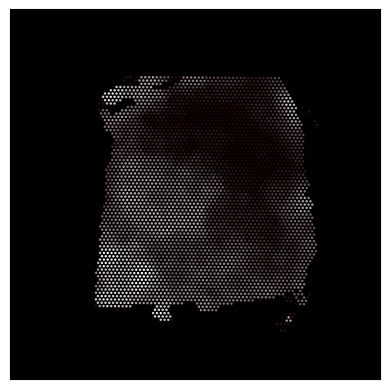

In [26]:
plot_spatial_scatter(scdata, transf_data[discard].mean(axis=0), plt.gca(), cmap=BWCMAP)

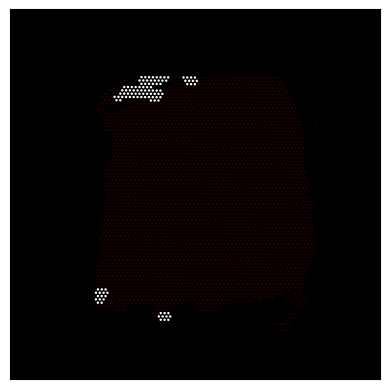

In [27]:
plot_spatial_scatter(scdata, transf_data[discard[34]], plt.gca(), cmap=BWCMAP)

it: 0/24
it: 10/24
it: 20/24


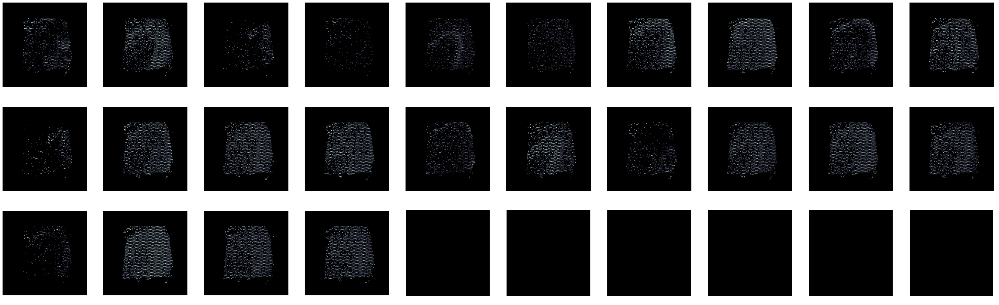

In [33]:
fig, axs = plt.subplots(nrows=len(redraw)//10+1, ncols=10, figsize=(5*10, 5*(len(redraw)//10+1)))

for i in range(len(redraw)):
    if i%10==0:
        print(f"it: {i}/{len(redraw)}")
    plot_spatial_scatter(scdata, array_data[smallest_redraw[i]], axs[i//10,i%10])
plt.show()

it: 0/45
it: 10/45
it: 20/45
it: 30/45
it: 40/45


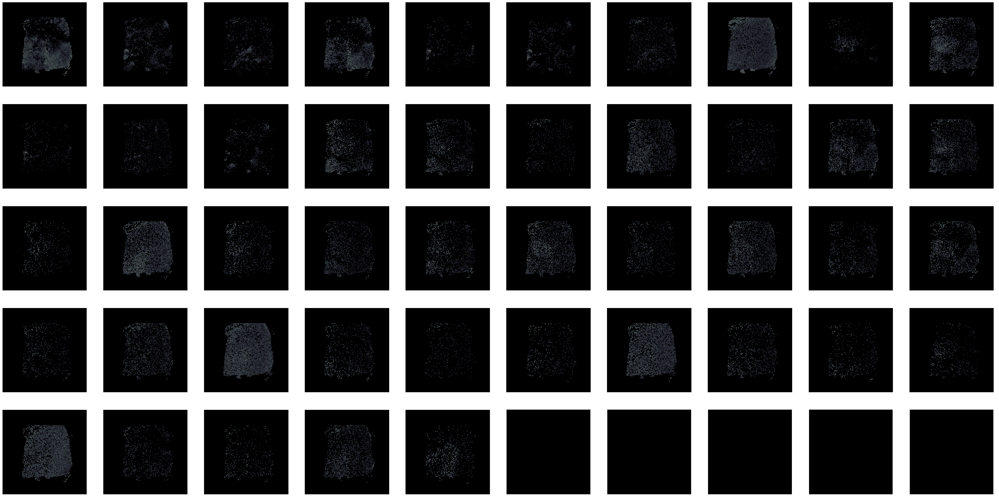

In [30]:
# discard = discard[:11]

fig, axs = plt.subplots(nrows=len(discard)//10+1, ncols=10, figsize=(5*10, 5*(len(discard)//10+1)))

for i in range(len(discard)):
    if i%10==0:
        print(f"it: {i}/{len(discard)}")
    plot_spatial_scatter(scdata, array_data[smallest_noise_filt[i]], axs[i//10,i%10])
plt.show()

In [61]:
adata = load_data()
array_data = array_data = adata.X.toarray().T

C:\Users\Workstation\magistrale\algo_ai\Lib\site-packages\anndata\_core\anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
C:\Users\Workstation\magistrale\algo_ai\Lib\site-packages\anndata\_core\anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [43]:
array_data   = adata.X.toarray().T
NGENES, NPOS = array_data.shape

over threshold: 2990


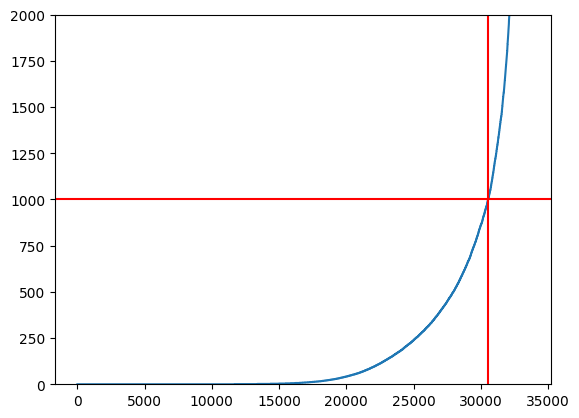

In [42]:
TH = 1000

cdf = np.sort(array_data.sum(axis=1))
plt.plot(cdf)

vlinex = (cdf < TH).sum()
print(f"over threshold: {NGENES - vlinex}")
plt.axvline(x = vlinex, color = 'r', linestyle = '-')
plt.axhline(y = TH,     color = 'r', linestyle = '-') 
plt.ylim([0, TH*2])
plt.show()